## Gradio Pets

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
key = os.environ.get('AZURE_SEARCH_KEY', 'c4b08a86c84a4fd09b79ed6792f1e87e')

In [3]:
!pip install -Uqq fastbook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 83.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.7/493.7 kB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 36.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 123.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 91.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 100.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 37.8 MB/s eta 0:00:00


In [4]:
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [5]:
from fastbook import *
from fastai.vision.widgets import *

In [6]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [7]:
results = search_images_bing('c4b08a86c84a4fd09b79ed6792f1e87e', 'grizzly bear')
ims = results.attrgot('contentUrl')
len(ims)

150

In [8]:
#hide
ims = ['http://3.bp.blogspot.com/-S1scRCkI3vY/UHzV2kucsPI/AAAAAAAAA-k/YQ5UzHEm9Ss/s1600/Grizzly%2BBear%2BWildlife.jpg']

In [9]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

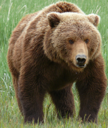

In [10]:
im = Image.open(dest)
im.to_thumb(128,128)

In [11]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [12]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} bear')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [13]:
fns = get_image_files(path)
fns

(#427) [Path('bears/black/1c2e79d3-0635-4b43-80d2-6d61d6db4093.jpg'),Path('bears/black/79e7c822-ad28-4aa3-8408-44acc2cb1e91.jpg'),Path('bears/black/b0c5977d-ed81-4a93-a32c-e75c6d215d5f.jpg'),Path('bears/black/453df583-d2c4-4391-bb4a-291f4908e25b.jpg'),Path('bears/black/b9121c31-a886-4604-98d1-f78f0335de4c.jpg'),Path('bears/black/262c9dee-d055-45b3-b21d-44deb9dba25e.jpg'),Path('bears/black/8e936b44-1a94-4600-8013-4d6e2362fd62.jpg'),Path('bears/black/2b94c5af-3ae1-44f4-86fa-88f7169d1313.jpg'),Path('bears/black/3d4cbba5-8720-4e32-936c-e8ac3a75fc9e.jpg'),Path('bears/black/54e68021-e16e-4494-b8d5-771259b2831e.jpg')...]

In [14]:
failed = verify_images(fns)
failed

(#18) [Path('bears/black/79e7c822-ad28-4aa3-8408-44acc2cb1e91.jpg'),Path('bears/black/c7051289-cab0-4a7d-9595-30deb70bca00.jpg'),Path('bears/black/19bc979b-d2be-4a91-87b5-b1c085f2f0ad.jpg'),Path('bears/black/842da38e-79cc-4b5b-85d5-f9b04b3ad9b3.jpg'),Path('bears/black/d60a4b26-91a1-49bd-971e-97ac9c959d63.jpg'),Path('bears/teddy/02bb02bf-2f4d-41dc-a585-ea45cf339115.JPG'),Path('bears/teddy/8a88b014-947e-4e99-82f4-80f2c34a2178.jpg'),Path('bears/teddy/863d4333-448a-4d06-9f38-dcd9d422645f.JPG'),Path('bears/teddy/8c07659a-92be-4af8-b9bb-86509912fc99.JPG'),Path('bears/teddy/103a7271-735b-4ab0-a7fc-2551c6cc0afb.JPG')...]

In [15]:
failed.map(Path.unlink)

(#18) [None,None,None,None,None,None,None,None,None,None...]

In [16]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [17]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [18]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 140MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.225102,0.506340,0.172840,00:17


epoch,train_loss,valid_loss,error_rate,time
0,0.171990,0.132113,0.012346,00:16
1,0.141934,0.149077,0.012346,00:17
2,0.126720,0.155598,0.012346,00:18
3,0.103689,0.152709,0.012346,00:16


In [19]:
interp = ClassificationInterpretation.from_learner(learn)

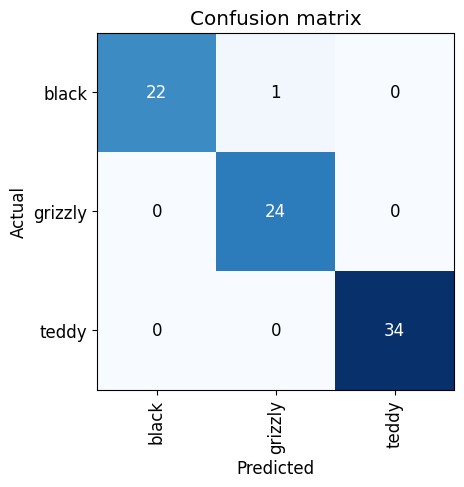

In [20]:
interp.plot_confusion_matrix()

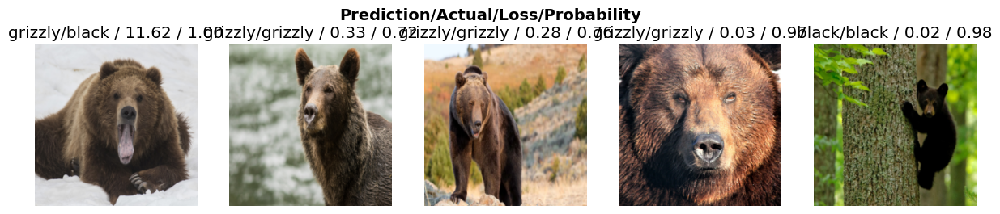

In [21]:
interp.plot_top_losses(5, nrows=1)

In [22]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [29]:
path

Path('bears')

In [30]:
learn.export()

In [31]:
path02 = Path()
path02.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [36]:
learn_inf = load_learner(path02/'export.pkl')

In [37]:
learn_inf.predict('images/grizzly.jpg')

('grizzly', tensor(1), tensor([6.3736e-05, 9.9993e-01, 3.6929e-06]))

In [38]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [39]:
#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [42]:
btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])

In [43]:
img = PILImage.create(btn_upload.data[-1])

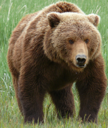

In [44]:
img.to_thumb(128,128)

In [45]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [47]:
type(img)

fastai.vision.core.PILImage

In [50]:
pred,pred_idx,probs = learn_inf.predict(img)

In [51]:
lbl_pred = widgets.Label()

In [54]:
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.9999')

In [55]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [56]:

def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

In [59]:
btn_run.on_click(on_click_classify)

In [60]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [61]:
#hide_output
VBox([widgets.Label('Select your bear!'),
      btn_upload, btn_run, out_pl, lbl_pred])